In [1]:
import sys
from pathlib import Path

sys.path.append(str(Path().cwd().parents[1]))

from typing import Dict, Generator, List, Tuple, Union

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import vectorbt as vbt
from src.plotting import plot_signal_conflicts, plot_signals
from src.SignalMaker import (get_alligator_signal, get_ao_indicator_signal,
                             get_fractal_signal, get_macd_signal,
                             get_north_money_signal)
from src.utils import trans_to_entries_exits

# 数据获取

In [2]:
codes: List[str] = [
    "000300.SH",
    "000001.SH",
    "000016.SH",
    "000905.SH",
    "000852.SH",
    "000985.CSI",
]

# 北向数据

north_money: pd.DataFrame = pd.read_parquet("data/north_money.parquet")


# 沪深300数据

daily: pd.DataFrame = pd.read_parquet("data/daily.parquet")


# daily.set_index("trade_date", inplace=True)


pivot_table: pd.DataFrame = pd.pivot_table(

    daily, index="trade_date", columns="code", values=["open", "high", "low", "close"]

)


high_df: pd.DataFrame = pivot_table["high"]

low_df: pd.DataFrame = pivot_table["low"]

close_df: pd.DataFrame = pivot_table["close"]

open_df: pd.DataFrame = pivot_table["open"]

In [3]:
daily.head()

,code,close,open,high,low,pre_close,change,pct_chg,volume,amount
trade_date,,,,,,,,,,
2005-01-04,000016.SH,827.071,836.988,836.988,824.008,842.728,-15.657,-1.8579,403169700.0,2.136409e+10
2005-01-04,000852.SH,989.984,996.278,996.278,982.988,1000.000,-10.016,-1.0016,49473755.0,2.595895e+09
2005-01-04,000905.SH,986.927,996.682,996.682,984.795,1000.000,-13.073,-1.3073,232376203.0,1.329187e+10
2005-01-04,000001.SH,1242.774,1260.782,1260.782,1238.179,1266.496,-23.722,-1.8730,816177000.0,4.418452e+10
2005-01-04,000300.SH,982.794,994.769,994.769,980.658,1000.000,-17.206,-1.7206,741286894.0,4.431977e+10


# 鳄鱼线 (the alligator)

## 什么是鳄鱼线

比尔·威廉斯是一位美国的商品投资顾问（CTA），有丰富的商品、股票、 外汇交易经验，他在 1995 年出版的《证券混沌操作法》中提出了“鳄鱼线” (the alligator) 的概念, 在当时美股、外汇和期货市场取得了非常丰厚的回报。时过境迁, 30 年过去, “鳄鱼线”策略能否在当下 A 股市场发挥魔力呢? 下面我们将依照比尔博士在《证券混沌操作法》中的指标构建和交易方法对鳄鱼线策略进行复现。考虑到类似“鳄鱼线”这样的技术分析策略包含较多设定和参数, 为避免策略回测中过拟合等问题,用鳄鱼线策略在 $\mathrm{A}$ 股市场回测时,指标的参数选择将基本沿袭原书中的设定。

首先, 来看什么是“鳄鱼线”? 根据《证券混沌操作法》中的叙述: 大体上来说, 鳄鱼是借由分形几何学与非线性动力学构架的一组均衡曲线。蓝线成为鳄鱼的下颚或下颌, 是图中代表时间周期的均线。蓝线代表了在没有新信息传入的情况下的市场状况。蓝线和实际价格走势之间的差异代表着交易者对新传入信息的理解和应对。红线是比图中所显示时间周期低一时间级别的均线, 低一级别, 具体来说就是图中时间周期的 1/5 周期, 如果当前为日线图, 那么蓝线就是日线的均线, 红线大约相当于小时级别的均线。绿线则是更低一时间级别的均线, 其时间跨度大约是红线的 1/5，大约相当于 5-10 分钟级别的均线。

新传入的信息首先会影响绿线, 随后是红线, 最后蓝线才会发生变化。如果出现了重大的突发事件, 交易者会受到影响, 因此价格走势会远离蓝线。显而易见, 绿线最易受传入信息的影响, 蓝线最稳定。为了便于理解, 我们形象地将蓝线成为 “鳄鱼的下颚”, 将红线成为“鳄鱼的牙齿”, 将绿线成为“鳄鱼的唇吻”。在交易者逐渐熟悉了这些名词之后, 鳄鱼这个概念就变得更加生动。鳄鱼线会提示交易者何如入场, 或何时应该在场外等待知道鳄鱼饥饿而张开嘴。总而言之, 鳄鱼线为我们提供了:

1. 透过单一的图表,同时观察三个不同时间周期的市场动量的一种整合性方法。
2. 判断趋势何时开始、何时停止的简单方法。
3. 在市场陷入区间整理、没有明显方向时的一种保护机制。
4. 显示趋势即将结束的一种高级指标。

![](img/01912535-9dd2-70ac-a7fd-da75d8beb2de_5_605520.jpg)

在很多情况下, 市场常常会陷入区间整理, 三条线会彼此纠缠, 这种走势传递出的信息说明交易者最好还是留在场外, 因为这时没有足够重要的新传入信息推动市场走出趋势。市场经常会在小区间内达到多空平衡, 这也是趋势在重要的支撑和阻力位附近会停歇的原因。

重大事件的发生或新信息的传入才能使原先那些场外的观望者入场交易。这些信息最好是新发生的或是意料之外的事件, 如此才能使更多的交易者进入市场, 从而提高被交易的股票或期货合约的数量。最终在需求和供给的驱动下, 市场才会出现显著的趋势。

新传入消息利多, 因此市场中出现了强烈的上升走势, 三条曲线开始向上发散, 鳄鱼开始从沉睡状态苏醒, 向上“吞食”价格, 我们将其称之为“饥饿的鳄鱼”。下图展现了另外一种情况: 如果新传入消息利空, 市场开始走出下跌趋势。鳄鱼开始张开嘴（绿线、红线、蓝线开始向下发散），向下吞食价格， 我们将其称之为“吃饱的鳄鱼”。此外，如果三条鳄鱼线相互纠缠，说明鳄鱼陷入了长时间的沉睡, 我们将其称之为“沉睡的鳄鱼”。在这种情况下, 交易者最好不要进场打扰鳄鱼, 应该耐心地等待鳄鱼的苏醒。如果交易者在鳄鱼沉睡的阶段强行入场交易，很有可能会由于市场不停地震荡而蒙受损失。


## 鳄鱼线及择时策略的构建

鳄鱼线是由三条时间周期不同的均线构成, 即长均线、中均线、短均线, 各条均线的构建方法如下:
1. 13 根价格柱的移动平均线, 同时向右 (未来) 移动 8 根价格柱。
2. 8 根价格柱的移动平均线, 同时向右 (未来) 移动 5 根价格柱。
3. 5 根价格柱的移动平均线, 同时向右 (未来)3 根价格柱。


关于鳄鱼线构建中涉及的移动平均参数和向右平移参数, 均取自威廉斯在 《证券混沌操作法》中的原始参数, 以避免参数过拟合问题。另外, 有意思的是, 参数（13、8、5、3）为斐波那契数列。

接下来基于鳄鱼线尝试在宽基指数 (以沪深 300 为例) 上构建择时信号: 若 T 日鳄鱼线呈现多头排列, 即上唇线>牙齿线>下颚线 (饥饿的鳄鱼), 则信号为看多,仓位为满仓; 若 $\mathrm{T}$ 日鳄鱼线呈现空头排列,即上唇线 $<$ 牙齿线 $<$ 下颚线 (吃饱的鳄鱼），则信号为看空，仓位为空仓；其他情况，无信号（沉睡的鳄鱼）， 维持前一交易日的仓位。交易价格取 $\mathrm{T} + 1$ 日指数开盘价,暂不考虑交易费用。

In [4]:
alligator_signal: pd.DataFrame = get_alligator_signal(close_df)

In [5]:
entries,exits = trans_to_entries_exits(alligator_signal["000300.SH"])

# init_cash默认为100元
# T日信号，T+1日买入所以买入信号和卖出信号都要shift(1)
pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df,  # Order price
    entries=entries.shift(1,fill_value=False),  # 买入信号
    exits=exits.shift(1,fill_value=False),  # 卖出信号
    close=close_df,
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

<Axes: xlabel='trade_date'>

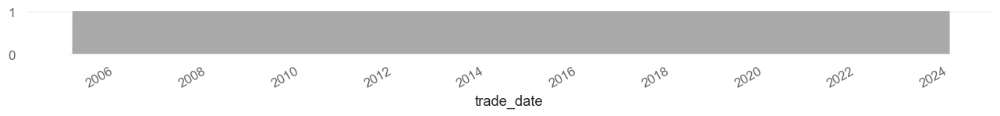

In [6]:
plot_signal_conflicts(entries,exits)

<Axes: xlabel='trade_date'>

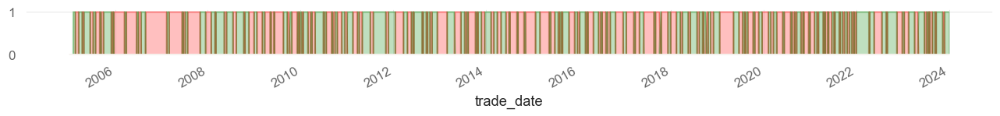

In [7]:
plot_signals(entries=entries, exits=exits)

原始研报中未加手续费，这里我加上了手续费，收益下滑很多，但未加手续费时也为达到研报回测的指标，所以整体来说并未复现出研报结果。

In [8]:
go.Figure(pf.plot_cum_returns(column="000300.SH"))

对开仓情况的可视化

In [9]:
go.Figure(pf.plot(subplots=["trades"],column="000300.SH"))

# 动量震荡指标 (AO)

在大多数情况下, 市场中没有明显的趋势, 只有在很少数情况下, 市场中才会出现容易辨识的趋势。只有场内交易员和少数交易专家才能驾驭这种行情, 大多数交易者设定的止损过紧, 经常被反复震荡的行情扫出局。只有在市场出现长期趋势时, 交易者才可能获得较大的利润, 因此, 交易者首先要考虑的就是不要错过任何重大行情。鳄鱼线提供了市场出现明显上涨或下跌趋势的信号, 但是 A 股博弈情绪较浓, 指数和个股都经常出现“假突破”的情况。因此, 入场点的选择也极为重要, 接下来, 我们引入一些其他的趋势和突破类指标, 进一步提升鳄鱼线策略的胜率和盈亏比。

下面，我们引入动量震荡指标（awesome oscillator, AO)。威廉斯在书中写道: “毫无疑问, 在商品期货和股票市场中, AO 指标是最佳的震荡指标。通过 AO 指标交易者可以清晰地观察市场的走势, 就好像在阅读明日的《华尔街日报》一样。”AO 指标是 5 根价格柱的简单移动平均值减去 34 根价格柱的简单移动平均值。AO 指标的构造很简单, 但很有效, 交易者只使用 $\mathrm{{AO}}$ 指标也可以在期货和股票市场中获利。

## 动量震荡指标构造方法

动量震荡指标为交易者提供了获利的钥匙。

动量震荡指标测算了 5 根价格柱相对于 34 根价格柱的动量变化。

首先计算最近 5 根价格柱的最高价和最低价间的中点的简单移动平均值, 即 (最高价 - 最低价) /2 的简单移动平均, 将得出的值减去最近 34 根价格柱的最高价和最低价中点的简单移动平均值, 即 (最高价 - 最低价) /2 的简单移动平均。两者之间的差值就是 AO 指标, 并以柱状图的形式显示。

动量震荡指标显示了当前的动量变化。


在tradiview中，AO指标的计算方式是：

- AO = SMA(High + Low, 5) - SMA(High + Low, 34)
    
- 但是研报中的计算方式是：AO = SMA(High - Low, 5) - SMA(High - Low, 34)

价格是市场中最后发生变化的要素。在价格发生变化之前, 动量会先发生变化; 在动量发生变化之前, 当前动量的速度先出现变化; 在动量的速度发生变化之前, 成交量会先出现变化; 在成交量发生变化之前, 所有交易者和投资者对市场的认知和采取的行动会先出现变化。

动量震荡指标是趋势起始阶段的第一个入场信号, 假定鳄鱼线出现了看多信号, 一旦显示市场动量变化的动量震荡指标连续 3 个交易日递增, 这就是一个不错的加仓信号。因此,基于鳄鱼线和 $\mathrm{{AO}}$ 指标的择时策略构建方法为: 若 $\mathrm{T}$ 日鳄鱼线呈多头排列,且 $\mathrm{{AO}}$ 指标连续 3 个交易日上行,则信号为看多,满仓; 若 $\mathrm{T}$ 日鳄鱼线呈空头排列, 或者 AO 指标连续 3 个交易日下行, 则信号为看空, 空仓: 其他情况, 无信号, 维持前一个交易日的仓位。注意, 这里看多信号的触发条件较为苛刻 (“且”, 需要两个条件均满足), 而看空信号的触发条件较为宽松 (“或”, 两个条件满足其一即可), 是因为 $\mathrm{A}$ 股市场博弈较多,存在许多“假突破”并且下跌往往很迅速, 因此, 看多应更为谨慎, 而看空应更加及时。

In [10]:
ao_signal: pd.DataFrame = get_ao_indicator_signal(high_df, low_df)

In [11]:
# 买入信号
entries = np.logical_and(
    alligator_signal["000300.SH"] == 1, ao_signal["000300.SH"] == 1
)

# 卖出信号
exits = np.logical_or(alligator_signal["000300.SH"] == -1, ao_signal["000300.SH"] == -1)

pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df,  # Order price
    entries=entries.shift(1,fill_value=False),  # 买入信号
    exits=exits.shift(1,fill_value=False),  # 卖出信号
    close=close_df,
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

<Axes: xlabel='trade_date'>

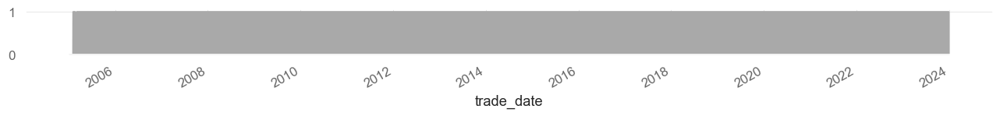

In [12]:
plot_signal_conflicts(entries,exits)

<Axes: xlabel='trade_date'>

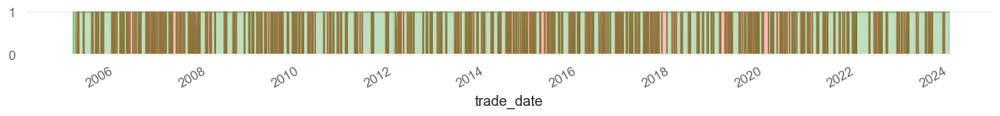

In [13]:
plot_signals(entries=entries, exits=exits)

如何不设置手续费收益会好很多

In [14]:
go.Figure(pf.plot_cum_returns(column="000300.SH"))

开仓信号可视化

In [15]:
go.Figure(pf.plot(subplots=["trades"],column="000300.SH"))

# 分形突破信号

## 什么是分形

分形 (Fractal) 原是几何学术语, 由波兰数学家曼德尔布罗提出, 是指具有以非整数维形式充填空间的形态特征。通常被定义为一个粗糙或零碎的几何形状, 可以分成数个部分, 且每一部分都是整体缩小后的形状, 即具有自相似性的性质。 数学和几何学中, 科赫曲线、谢尔宾斯基三角形、康托尔集等都是分形学发展史上的重要里程碑。自然界和现实世界中, 雪花、罗马花椰菜、晶体甚至英国的海岸线都与分形结构密不可分。

在金融市场中, 分形形态也并不复杂。市场总会向一个方向或另一个方向运行。经过一段时间之后, 所有的多头都已经入场 (上升趋势中), 由于买盘不继或者短线空头入场, 市场开始下跌回调, 随后, 新信息的传入开始影响交易者的判断, 新的买盘开始出现, 市场再次开始上涨。如果当时市场的动量或多头的力量足以使价格突破前期的向上分形, 那么交易者应在分形高点之上买入。

下图中形态 $A$ 是标准的分形形态 (上分形) 。(向) 上分形的定义是: 至少由连续 5 根价格柱组成, 最高的高点左右有两根较低的高点, 这两个高点的左方或右方又有两个较低的高点 (下分形的构造正好与此相反)。较视觉化的方法就是, 举起你的一只手, 放在眼前, 手指展开并且中指向上。你的手指就是你的连续的 5 根价格柱, 你的中指就是最高的高点, 这就构成了一个分形形态。

![](img/01912535-9dd2-70ac-a7fd-da75d8beb2de_12_891808.jpg)

形态 $\mathrm{A}$ 是原始的分形形态,形态 $\mathrm{B}$ 同时满足上分形也是下分形的定义,因为中间的分形 (中指) 的高点高于左右两边的两根价格柱的高点, 同时低点也低于左右两边的两根价格柱的低点。形态 $\mathrm{C}$ 显示了在 6 根价格柱中同时出现的上分形和下分形, 这个分形结构共用价格柱。形态 D 是 6 根价格柱组成的分形形态, 因为第 5 根价格柱的最高点等于此前的最高点。在买入分形 (上分形) 中, 交易者只需观察每根价格柱的最高点; 在卖出分形 (下分形) 中, 交易者只需观察每根价格柱的最低点。

## 基于分形的择时策略构建

基于分形的择时信号构建如下: 若 $\mathrm{T}$ 日指数收盘价向上突破最近上分形的最高价 (第 3 根价格柱的高点),则视为 $\mathrm{K}$ 线向上突破阻力位,信号为看多,仓位为满仓; 若 $\mathrm{T}$ 日指数收盘价向下突破最近下分形的最低价 (第 3 根价格柱的低点), 则视为 $\mathrm{K}$ 线向下突破支撑位,信号为看空,仓位为空仓; 其他情况,无信号,维持前一个交易日的仓位。

接下来把鳄鱼线策略同 AO、分形两个信号结合, 分别记为 Alligator、AO、 Fractal。若 $\mathrm{T}$ 日 $\mathrm{{AND}}$ (Alligator $= 1,\mathrm{{OR}}\left( {\mathrm{{AO}} = 1,\text{ Fractal } = 1}\right)$ ),则信号为看多,仓位为满仓；若 $\mathrm{T}$ 日 $\mathrm{{OR}}$ (Alligator=-1, $\mathrm{{AO}} = - 1,\mathrm{{Fractal}} = - 1$ ),则信号为看空,仓位为空仓; 其他情况, 无信号, 维持前一个交易日的仓位。

In [16]:
fractal_signal: pd.DataFrame = get_fractal_signal(close_df, high_df, low_df)

In [17]:
# 买入信号
entries: pd.Series = np.logical_and(
    alligator_signal == 1, np.logical_or(ao_signal == 1, fractal_signal == 1)
)["000300.SH"]
# 卖出信号
exits: pd.Series = np.logical_or(
    alligator_signal == -1, np.logical_or(ao_signal == -1, fractal_signal == -1)
)["000300.SH"]

<Axes: xlabel='trade_date'>

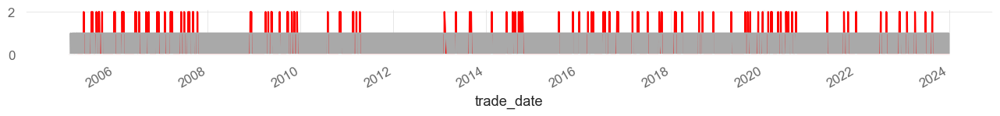

In [18]:
# 有为2的标签说明当日既有买入信号又有卖出信号
plot_signal_conflicts(entries,exits)

<Axes: xlabel='trade_date'>

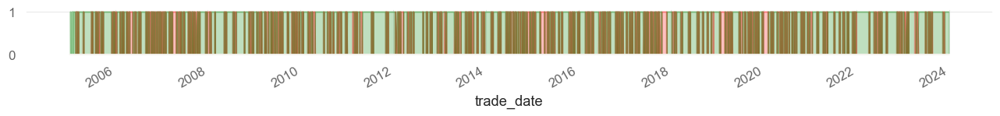

In [19]:
plot_signals(entries=entries, exits=exits)

In [20]:
# 由于开仓信号与平仓信号有冲突，参数upon_long_conflict用于控制开仓信号优先还是平仓信号优先
# upon_long_conflict默认ignore，即忽略开仓信号与平仓信号冲突,这里我们设置为exit，即优先平仓
pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df,  # Order price
    entries=entries.shift(1, fill_value=False),  # 买入信号
    exits=exits.shift(1, fill_value=False),  # 卖出信号
    close=close_df,
    direction="longonly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    upon_long_conflict="exit",  # 冲突时优先平仓
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

In [21]:
# 获取信号冲突位置
signal_records:pd.Series = entries.astype(int) + exits.astype(int)
signal_records[signal_records==2]

trade_date
2005-04-27    2
2005-06-27    2
2005-07-06    2
2005-08-05    2
2005-08-24    2
             ..
2022-12-09    2
2023-02-03    2
2023-04-07    2
2023-06-28    2
2023-08-21    2
Name: 000300.SH, Length: 115, dtype: int32

In [22]:
# 因为2005-04-27的信号会在2005-04-28平仓，所以我们查看2005-04-28的交易记录
pf.orders.records_readable.query("Timestamp=='2005-04-28'")

,Order Id,Column,Timestamp,Size,Price,Fees,Side
7,7,000001.SH,2005-04-28,82000.0,1145.746,14092.675800,Sell
605,605,000016.SH,2005-04-28,120900.0,779.699,14139.841365,Sell
1203,1203,000300.SH,2005-04-28,102200.0,923.529,14157.699570,Sell
1801,1801,000852.SH,2005-04-28,117200.0,787.364,13841.859120,Sell
2399,2399,000905.SH,2005-04-28,111000.0,837.384,13942.443600,Sell
2997,2997,000985.CSI,2005-04-28,106200.0,885.117,14099.913810,Sell


In [23]:
# 查看2005-06-27,发现仅2005-06-30有个开仓，查看交易记录，见下表
pf.orders.records_readable.query("Timestamp>='2005-06-27'")

,Order Id,Column,Timestamp,Size,Price,Fees,Side
8,8,000001.SH,2005-06-30,85200.0,1103.4770,14102.436060,Buy
9,9,000001.SH,2005-07-07,85200.0,1033.2180,13204.526040,Sell
10,10,000001.SH,2005-07-08,84900.0,1036.4120,13198.706820,Buy
11,11,000001.SH,2005-07-11,84900.0,1026.7900,13076.170650,Sell
12,12,000001.SH,2005-08-01,80500.0,1082.7960,13074.761700,Buy
...,...,...,...,...,...,...,...
3583,3583,000985.CSI,2023-08-08,44400.0,4925.5301,32804.030466,Sell
3584,3584,000985.CSI,2023-08-15,45600.0,4790.7691,32768.860644,Buy
3585,3585,000985.CSI,2023-08-22,45600.0,4650.7872,31811.384448,Sell
3586,3586,000985.CSI,2023-11-15,45700.0,4639.2394,31801.986087,Buy


In [24]:
# id=3的记录表示在2005-06-27冲突期间并没有持仓，所以没有交易记录
pf.trades.records_readable

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,000001.SH,76200.0,2005-02-28,1311.4390,14989.747770,2005-03-01,1305.2490,14918.996070,-5.015867e+05,-0.005019,Long,Closed,0
1,1,000001.SH,76800.0,2005-03-04,1294.1560,14908.677120,2005-03-08,1298.2500,14955.840000,2.845547e+05,0.002863,Long,Closed,1
2,2,000001.SH,77400.0,2005-03-14,1288.9850,14965.115850,2005-03-21,1226.1430,14235.520230,-4.893171e+06,-0.049046,Long,Closed,2
3,3,000001.SH,82000.0,2005-04-26,1155.6440,14214.421200,2005-04-28,1145.7460,14092.675800,-8.399431e+05,-0.008864,Long,Closed,3
4,4,000001.SH,85200.0,2005-06-30,1103.4770,14102.436060,2005-07-07,1033.2180,13204.526040,-6.013374e+06,-0.063961,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1789,1789,000985.CSI,44300.0,2023-06-30,4812.1133,31976.492878,2023-07-06,4866.7071,32339.268679,2.354190e+06,0.011043,Long,Closed,1789
1790,1790,000985.CSI,45200.0,2023-07-24,4777.1294,32388.937332,2023-07-28,4833.2111,32769.171258,2.469735e+06,0.011438,Long,Closed,1790
1791,1791,000985.CSI,44400.0,2023-08-03,4913.0588,32720.971608,2023-08-08,4925.5301,32804.030466,4.882007e+05,0.002238,Long,Closed,1791
1792,1792,000985.CSI,45600.0,2023-08-15,4790.7691,32768.860644,2023-08-22,4650.7872,31811.384448,-6.447755e+06,-0.029515,Long,Closed,1792


In [25]:
go.Figure(pf.plot_cum_returns(column="000300.SH"))

In [26]:
go.Figure(pf.plot(subplots=["trades"],column="000300.SH"))

In [27]:
# 查看交易明细
pf.trades.records_readable

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,000001.SH,76200.0,2005-02-28,1311.4390,14989.747770,2005-03-01,1305.2490,14918.996070,-5.015867e+05,-0.005019,Long,Closed,0
1,1,000001.SH,76800.0,2005-03-04,1294.1560,14908.677120,2005-03-08,1298.2500,14955.840000,2.845547e+05,0.002863,Long,Closed,1
2,2,000001.SH,77400.0,2005-03-14,1288.9850,14965.115850,2005-03-21,1226.1430,14235.520230,-4.893171e+06,-0.049046,Long,Closed,2
3,3,000001.SH,82000.0,2005-04-26,1155.6440,14214.421200,2005-04-28,1145.7460,14092.675800,-8.399431e+05,-0.008864,Long,Closed,3
4,4,000001.SH,85200.0,2005-06-30,1103.4770,14102.436060,2005-07-07,1033.2180,13204.526040,-6.013374e+06,-0.063961,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1789,1789,000985.CSI,44300.0,2023-06-30,4812.1133,31976.492878,2023-07-06,4866.7071,32339.268679,2.354190e+06,0.011043,Long,Closed,1789
1790,1790,000985.CSI,45200.0,2023-07-24,4777.1294,32388.937332,2023-07-28,4833.2111,32769.171258,2.469735e+06,0.011438,Long,Closed,1790
1791,1791,000985.CSI,44400.0,2023-08-03,4913.0588,32720.971608,2023-08-08,4925.5301,32804.030466,4.882007e+05,0.002238,Long,Closed,1791
1792,1792,000985.CSI,45600.0,2023-08-15,4790.7691,32768.860644,2023-08-22,4650.7872,31811.384448,-6.447755e+06,-0.029515,Long,Closed,1792


# MACD

MACD（异同移动平均线) 是最常见的技术分析指标, 由慢线 DEA、快线 DIFF、能量柱、零轴等构成。其中, DIFF=12 日 EMA-26 日 EMA, DEA=DIFF 的 9 日 EMA, 能量柱= (DIF-DEA) $\times 2$ 。注意,这里快线、慢线及 DEA 的指数平滑周期取 MACD 模型的默认值, 即 12、26、9, 以避免过拟合。
![](img/01912535-9dd2-70ac-a7fd-da75d8beb2de_15_737719.jpg)
若 DIF (快线) 上穿 DEA (慢线), 同时能量柱由绿转红, 说明价格开始止跌反弹, 未来可能上涨, 因此信号为看多。按照看多信号所处的位置（在零轴以上、零轴以下、零轴附近), 可以分为水上看多信号 (发生在零轴上方)、水下看多信号（发生在零轴下方）和零轴看多信号 (发生在零轴附近)。虽然同为看多, 都意味着市场反弹的趋势, 但是所处位置不同, 背后的含义亦有所不同: 当看多信号在水上, 说明市场已经处于上涨趋势, 往往意味着新一波大涨的开始; 当看多信号在水下, 说明市场处于下跌通道, 此时的看多信号可能只是市场短暂反弹或空头诱多, 后面可能继续恢复下跌趋势, 因此水下看多信号的可靠性相对较低, 一般水下看多信号需要多次验证才能证明市场真正迎来反弹; 零轴看多信号说明市场处于盘整 (磨底) 阶段, 多空双方力量均衡, 此时平衡一旦打破, 可能会迎来一波大的趋势。看空信号同理, 下跌趋势中的看空 (水下看空）信号和盘整期中的看空（零轴看空）信号更有效。

因此, 下面我们将基于水上看多信号、零轴看多信号、水下看空信号、零轴看空信号来构建择时信号: 若 $\mathrm{T}$ 日触发水上或零轴看多信号,则 MACD 信号为看多; 若 $\mathrm{T}$ 日触发水下或零轴看空信号,则 MACD 信号为看空; 其他情况, 无信号。
![](img/01912535-9dd2-70ac-a7fd-da75d8beb2de_14_976431.jpg)
接下来把鳄鱼线策略同 AO、分形、MACD 三个信号结合, 分别记为 Alligator、 AO、Fractal、MACD。若 T 日 AND(Alligator=1, OR(Fractal=1, MACD=1))，则信号为看多,仓位为满仓; 若T 日 OR (Alligator=-1, AO=-1, Fractal=-1, MACD=-1), 则信号为看空，仓位为空仓；其他情况，无信号，维持前一个交易日的仓位。

In [28]:
macd_signal:pd.DataFrame = get_macd_signal(close_df)

In [29]:
entries: pd.Series = np.logical_and(
    alligator_signal == 1, np.logical_or(fractal_signal == 1, macd_signal == 1)
)["000300.SH"]

exits: pd.Series = np.logical_or(
    alligator_signal == -1, np.logical_or(ao_signal == -1, macd_signal == -1)
)["000300.SH"]

<Axes: xlabel='trade_date'>

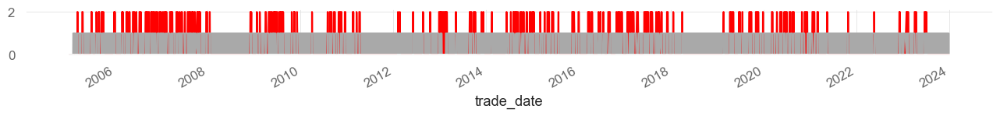

In [30]:
plot_signal_conflicts(entries,exits)

<Axes: xlabel='trade_date'>

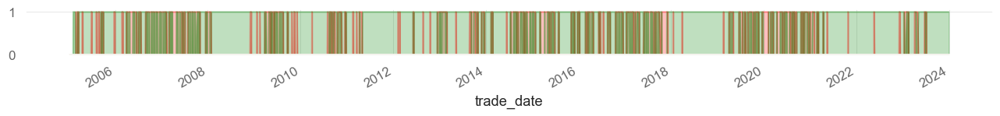

In [31]:
plot_signals(entries=entries, exits=exits)

In [32]:
pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df,  # Order price
    entries=entries.shift(1,fill_value=False),  # 买入信号
    exits=exits.shift(1,fill_value=False),  # 卖出信号
    close=close_df,
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    upon_long_conflict="exit",  # 冲突时优先平仓
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

In [33]:
go.Figure(pf.plot_cum_returns(column="000300.SH"))

In [34]:
go.Figure(pf.plot(subplots=["trades"],column="000300.SH"))

# 北向资金择时

其实还不如简单粗暴的北向择时大法

In [35]:
north_money_signal: pd.Series = get_north_money_signal(north_money)

In [36]:
entries,exits = trans_to_entries_exits(north_money_signal)

<Axes: xlabel='trade_date'>

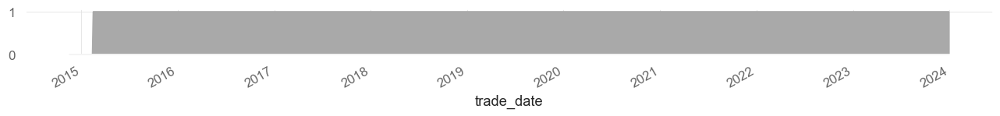

In [37]:
plot_signal_conflicts(entries,exits)

<Axes: xlabel='trade_date'>

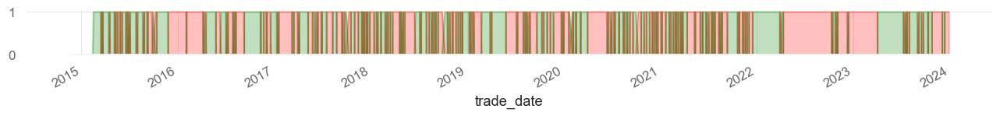

In [38]:
plot_signals(entries=entries, exits=exits)

In [39]:
pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df.loc[north_money_signal.index],  # Order price
    entries=entries.shift(1,fill_value=False),  # 买入信号
    exits=exits.shift(1,fill_value=False),  # 卖出信号
    close=close_df.loc[north_money_signal.index],
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    upon_long_conflict="exit",  # 冲突时优先平仓
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

In [40]:
go.Figure(pf.plot_cum_returns(column="000300.SH"))

# 信号合并

## 叠加北向资金

In [41]:
# 北向资金开始年份
begin:pd.Timestamp = north_money_signal.index.min()

alligator_signal_s:pd.DataFrame = alligator_signal.loc[begin:]
ao_signal_s:pd.DataFrame = ao_signal.loc[begin:]
fractal_signal_s:pd.DataFrame = fractal_signal.loc[begin:]
macd_signal_s:pd.DataFrame = macd_signal.loc[begin:]

north_money_signal: pd.Series = north_money_signal.reindex(
    alligator_signal_s.index
).ffill()

In [42]:
north_money_signal_arr: pd.DataFrame = pd.DataFrame(data=np.repeat(
    north_money_signal.values.reshape(-1, 1), 6, axis=1
),index=alligator_signal_s.index,columns=alligator_signal_s.columns)

In [43]:
entries: pd.DataFrame = np.logical_and(
    np.logical_or(
        north_money_signal_arr==1,
        alligator_signal_s.values == 1,
    ),
    np.logical_or(fractal_signal_s.values == 1, macd_signal_s.values == 1),
    dtype=bool,
)

exits: pd.DataFrame = (
    (north_money_signal_arr == -1)
    | (alligator_signal_s == -1)
    | (ao_signal_s == -1)
    | (fractal_signal_s == -1)
    | (macd_signal_s == -1)
)

In [44]:

pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df.loc[begin:],  # Order price
    entries=entries,  # 买入信号
    exits=exits,  # 卖出信号
    close=close_df.loc[begin:],
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    upon_long_conflict="exit",  # 冲突时优先平仓
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

In [45]:
for code in codes:
    go.Figure(pf.plot_cum_returns(column=code,title=code)).show()

## 研报中信号的合并方法

把鳄鱼线策略同 AO、分形、MACD 三个信号结合，分别记为 Alligator、 AO、Fractal、MACD。若 T 日 AND(Alligator=1,OR(Fractal=1,MACD=1))，则 信号为看多，仓位为满仓；若 T 日 OR (Alligator=-1,AO=-1,Fractal=-1,MACD=-1)， 则信号为看空，仓位为空仓；其他情况，无信号，维持前一个交易日的仓位。

In [46]:
entries: pd.DataFrame = np.logical_and(
    alligator_signal_s == 1,
    np.logical_or(fractal_signal_s == 1, macd_signal_s == 1),
    dtype=bool,
)

exits: pd.DataFrame = (
    (alligator_signal_s == -1)
    | (ao_signal_s == -1)
    | (fractal_signal_s == -1)
    | (macd_signal_s == -1)
)

In [47]:

pf: vbt.Portfolio = vbt.Portfolio.from_signals(
    price=open_df.loc[begin:],  # Order price
    entries=entries,  # 买入信号
    exits=exits,  # 卖出信号
    close=close_df.loc[begin:],
    direction="LongOnly",  # 只能做多
    fees=0.00015,  # 手续费设置为0.00015
    freq="1d",  # 交易频率为1天
    upon_long_conflict="exit",  # 冲突时优先平仓
    size_granularity=100,  # 交易单位为100股
    init_cash=1e8,  # 初始资金为1e8
)

In [48]:
for code in codes:
    go.Figure(pf.plot_cum_returns(column=code,title=code)).show()